# Synapse Visualizer with plotly interactive graphs

This notebook is modified from Allen Institute tutorial on working with Meshes by Forrest Collman  
The original tutorial is located here:   https://github.com/AllenInstitute/MicronsBinder/blob/master/notebooks/intro/MeshExample.ipynb  
Updated on Jan 6, 2023 with synapse ids that match Neuroglancer synapse ids
Added plotly graphs in September 2023

# Python Requirements
You will need to run this notebook in a Python 3.7 environment  
Sometime meshparty will have a conflict with other tools and not work properly in Anaconda  
If that happens, you will need to start over with a new Anaconda environment  
Install allensdk first, then meshparty, then any other other tools desired  
The installation described below worked well:  
* Install new environment v3.7 in Anaconda
* conda install jupyter
* pip install allensdk
* pip install meshparty
* pip install caveclient
* pip install 'itkwidgets[notebook]>=1.0a8'
* pip install --upgrade --pre itk
* pip install gdown

In [1]:
import matplotlib.pyplot as plt
from mpl_toolkits import mplot3d
import pandas as pd
import numpy as np
import os
import plotly.express as px
import plotly.graph_objects as go
from meshparty import trimesh_io, trimesh_vtk, skeleton, utils

In [2]:
# setup the mesh meta to handle downloads and caching
mesh_dir = 'data/neuron_meshes_v185/' # or change to your desired folder
seg_source = "precomputed://https://storage.googleapis.com/microns_public_datasets/pinky100_v185/seg"
mm = trimesh_io.MeshMeta(cv_path=seg_source,
                         disk_cache_path=mesh_dir, 
                         cache_size=20)

In [3]:
# enter a cell id of interest (copy and paste from Neuroglancer or a dataframe of interest)

cell_id = 648518346349539934

#some interesting neurons

# 648518346349538440 this excitatory pyramidal neuron has the most total synapses in the volume
# 648518346349539215 this inhibitory basket neuron has the most pre-synaptic sites in the volume
# 648518346349536971 no soma in the volume, appears to have an axon-carrying dendrite
# 648518346349515985 this inhibitory neuron of unknown subtype has 5 pre-synaptic sites that appears to be on dendrites
# 648518346349508279 not a neuron; this is an oligodendrocyte which has synaptic sites most likely due to mis-segmentation
# 648518346349537741 the largest continous mitochondrion by voxels, for an excitatory pyramidal neuron in the volume
# 648518346349538791 the largest continous mitochondrion by voxels, for an inhibitory neuron in the volume (basket) 
# 648518346349537611 partial excitatory pyramidal neuron with interesting mitochondria and synapse features
# 648518346349538179 Martinotti inhibitory neuron
# 648518346349540055 Excitatory pyramidal neuron with 9 pre-syn sites not located on the axon
# 648518346349538789 Inhibitory neurogliaform interneuron
# 648518346349527116 Partial pyramidal neuron listed as unknown in soma valence table; suspicious pre-syn sites (4)
# 648518346349536938 a partial axon and basal dendrite from a soma near but outside the volume; a large # of synapses in the volume
# 648518346349537042 interesting pyramidal neuron
# 648518346349527116 partial pyramidal neuron in the corner of a volume
# 648518346349539887 pyramidal neuron
# 648518346349538157 pyramidal neuron slightly off axis
# 648518346342793912 long apical dendrite from L4-6 with a prominent axon-carrying dendrite
# 648518346349531742 very large axon (with oligo mis-segmentation) with no soma in volume; must be from axon-carrying dendrite
# 648518346341400604 multiple segmentation issues; separate dendrites, axons, and possible vasc cells to same cellid
# 648518346341398062 potential axon-carrying dendrite but might be mis-segmentation; one dendrite and multiple axons w/ same cellid
# 648518346349520173 three intertwined apical dendrites from L5 or 6 with axons part of same cellid; hard to tell if axon-carrying dendrites or not
# 648518346349515497 interesting axon without a soma in the volume
# 648518346341364052 possible axon-carrying dendrite; also a process that has high # of synapse near largest mito (866030) in volume (belonging to astrocyte 648518346349527319)
# 648518346349536748 edge of volume neuron; the axon appears to branch and the branch morphologically looks like an axon, but has no pre-synapses on it (suggesting it is a dendrite), but morphologically appears to be an axon
# 648518346349537718
# 648518346349510740 microglia with mis-segmented axons and spiny dendrites
# 648518346349509733 extensive axon process only coming from a deeper cortical layer
# 648518346349537301 Dendritic spine with extensive axon, hard to know if it is a true AcD vs. mis-segmentation
# 648518346349486955 Nearby process that might be mis-segmented with 37301; also appears to have it's own mis-segmentation with a spiny dendrite
# 648518346349539934 Excellent pyr neuron
# 648518346349536391 partial pyr neuron with basal dendrite in volume

In [4]:
seg_id = cell_id
downloadmesh = mm.mesh(seg_id = seg_id, remove_duplicate_vertices=True)
mesh_file = os.path.join(mesh_dir, str(seg_id)+'.h5')
mesh = mm.mesh(filename = mesh_file)

In [5]:
print(f'cellid:',seg_id)
print(f'mesh file:',mesh_file)
print(f'vertices:',mesh.n_vertices)
print(f'faces:',mesh.n_faces)

cellid: 648518346349539934
mesh file: data/neuron_meshes_v185/648518346349539934.h5
vertices: 2029904
faces: 4060044


In [6]:
# read in the full synapse table if you have saved a copy locally
soma_subgraph_df = pd.read_csv('data/221206_pni_synapses_v185.csv')

# uncomment and use this code to read from zenodo (slow)
# pd.read_csv("https://zenodo.org/record/7510511/files/221206_pni_synapses_v185.csv")

In [7]:
soma_subgraph_df

,id,pre_root_id,post_root_id,cleft_vx,ctr_pt_x_nm,ctr_pt_y_nm,ctr_pt_z_nm,pre_pos_x_vx,pre_pos_y_vx,pre_pos_z_vx,ctr_pos_x_vx,ctr_pos_y_vx,ctr_pos_z_vx,post_pos_x_vx,post_pos_y_vx,post_pos_z_vx
0,2477272,648518346349538285,648518346349536759,1103,280784,261896,40600,70050,65534,1015,70196,65474,1015,70104,65602,1015
1,4538436,648518346342404863,648518346342414574,62,365832,292808,25800,91472,73196,645,91458,73202,645,91396,73216,645
2,1124039,648518346342921567,648518346345323296,62,229144,155952,48080,57250,39028,1202,57286,38988,1202,57312,38966,1203
3,5245264,648518346342796822,648518346349537255,955,398452,208560,50760,99538,52184,1276,99613,52140,1269,99550,52098,1276
4,6928613,648518346342800412,648518346348190542,718,461868,245212,53560,115462,61350,1335,115467,61303,1339,115468,61296,1335
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3239270,2167340,648518346348045782,648518346349537840,106,268776,173356,14360,67190,43302,361,67194,43339,359,67216,43364,360
3239271,1944654,648518346347834064,648518346349537840,50,267344,156520,8520,66762,39152,213,66836,39130,213,66874,39134,213
3239272,2749491,648518346347876810,648518346349537840,139,292772,156680,12600,73136,39170,315,73193,39170,315,73218,39160,315
3239273,6924909,648518346348343883,648518346349537840,987,462768,237776,8520,115680,59370,208,115692,59444,213,115628,59430,214


In [8]:
# filter all the pre- and post- synapses for this cell
cell_post_subgraph = soma_subgraph_df.query(f'post_root_id=={seg_id}') #this shows all post-syn sites on this seg_id cell
cell_pre_subgraph = soma_subgraph_df.query(f'pre_root_id=={seg_id}') #this one shows all pre-syn sites on the axon of seg_id cell

# make an array of xyz synapse positions
postsyn_xyz=cell_post_subgraph[['ctr_pt_x_nm', 'ctr_pt_y_nm', 'ctr_pt_z_nm']].values
presyn_xyz=cell_pre_subgraph[['ctr_pt_x_nm', 'ctr_pt_y_nm', 'ctr_pt_z_nm']].values

In [9]:
# set the granularity (the number of datapoints to skip); highest resolution = 1 = include all datapoints

granularity = 50  # default = 50 (use every 50th datapoint)

(311579.84375, 148939.40625)

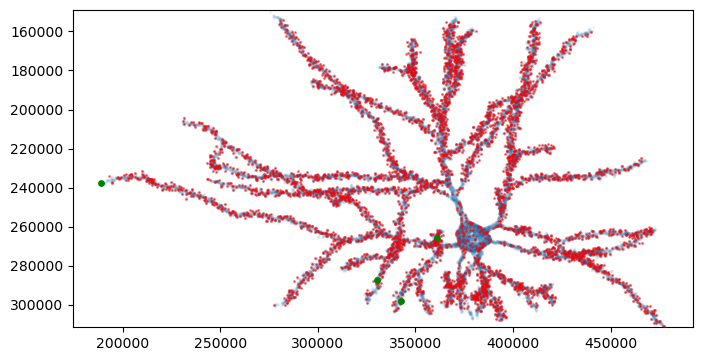

In [10]:
# matplotlib scatterplot

f,ax = plt.subplots(figsize=(8,8))
ax.scatter(mesh.vertices[::granularity,0], mesh.vertices[::granularity,1], s=2, alpha=0.05) # modify s and alpha to improve the visualization

ax.scatter(postsyn_xyz[:,0], postsyn_xyz[:,1], c='red', s=1, alpha=0.5) # modify c, s, and alpha if desired
ax.set_aspect('equal')
ax.set_ylim(np.max(mesh.vertices[:,1]), np.min(mesh.vertices[:,1]))

ax.scatter(presyn_xyz[:,0], presyn_xyz[:,1], c='green', s=15, alpha=1) # modify c, s, and alpha if desired
ax.set_aspect('equal')
ax.set_ylim(np.max(mesh.vertices[:,1]), np.min(mesh.vertices[:,1]))

(311579.84375, 148939.40625)

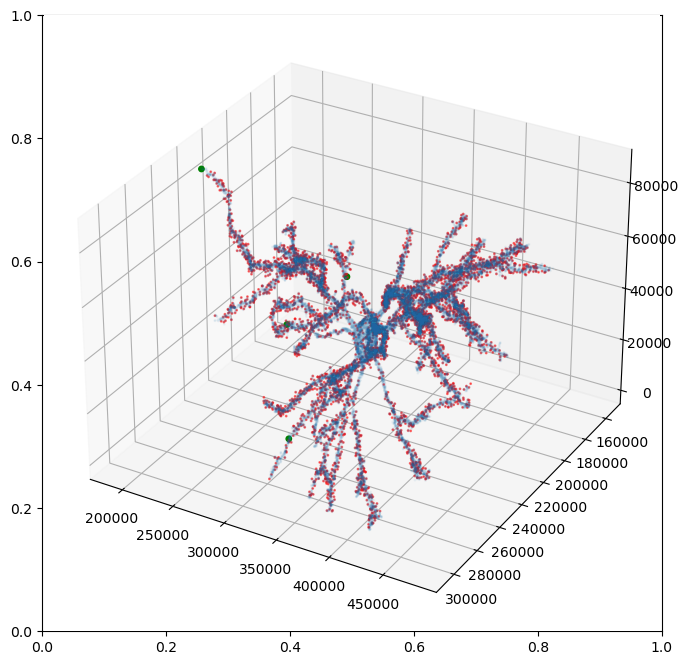

In [11]:
# matplotlib 3d scatterplot

f,ax = plt.subplots(figsize=(8,8))
ax = plt.axes(projection ="3d")
ax.scatter3D(mesh.vertices[::granularity,0], mesh.vertices[::granularity,1], mesh.vertices[::granularity,2], s=1, alpha=0.05) # modify s and alpha to improve the visualization

ax.scatter3D(postsyn_xyz[:,0], postsyn_xyz[:,1], postsyn_xyz[:,2], c='red', s=1, alpha=0.5) # modify c, s, and alpha if desired
#ax.set_aspect('equal')
ax.set_ylim(np.max(mesh.vertices[:,1]), np.min(mesh.vertices[:,1]))

ax.scatter3D(presyn_xyz[:,0], presyn_xyz[:,1], presyn_xyz[:,2], c='green', s=15, alpha=1) # modify c, s, and alpha if desired
#ax.set_aspect('equal')
ax.set_ylim(np.max(mesh.vertices[:,1]), np.min(mesh.vertices[:,1]))

In [12]:
# plotly interactive 2d scatterplot

fig = px.scatter(x=mesh.vertices[::granularity,0], y=mesh.vertices[::granularity,1])
fig.update_traces(marker_size=1)

fig.add_trace(
    go.Scatter(
        x=postsyn_xyz[:,0],
        y=postsyn_xyz[:,1],
        mode="markers",
        marker=dict(size=3),
        showlegend=False)
)

fig.add_trace(
    go.Scatter(
        x=presyn_xyz[:,0],
        y=presyn_xyz[:,1],
        mode="markers",
        marker=dict(size=10),
        showlegend=False)
)

fig.show()

In [13]:
# plotly interactive 3d scatterplot with no synapses

#fig = px.scatter_3d(x=mesh.vertices[::granularity,0], y=mesh.vertices[::granularity,1], z=mesh.vertices[::granularity,2])
#fig.update_traces(marker_size=1)
#fig.show()

In [14]:
# plotly interactive 3d scatterplot with synapses

fig = go.Figure(data=[go.Scatter3d(
    x=mesh.vertices[::granularity,0],
    y=mesh.vertices[::granularity,1],
    z=mesh.vertices[::granularity,2],
    mode='markers',
    marker=dict(size=1),
    showlegend=False)
                     ])
fig.add_trace(
    go.Scatter3d(
        x=postsyn_xyz[:,0],
        y=postsyn_xyz[:,1],
        z=postsyn_xyz[:,2],
        mode="markers",
        marker=dict(size=2),
        showlegend=False)
)

fig.add_trace(
    go.Scatter3d(
        x=presyn_xyz[:,0],
        y=presyn_xyz[:,1],
        z=presyn_xyz[:,2],
        mode="markers",
        marker=dict(size=3),
        showlegend=False)
)

fig.show()

In [15]:
print(f'number of post-synaptic sites:',len(postsyn_xyz))
print(postsyn_xyz)

number of post-synaptic sites: 4683
[[408388 234912  59160]
 [397992 228872  63120]
 [340148 293760  65240]
 ...
 [409200 264256  72160]
 [339472 241552  29400]
 [230064 239624  65280]]


In [16]:
print(f'number of pre-synaptic sites:',len(presyn_xyz))
print(presyn_xyz)

number of pre-synaptic sites: 4
[[189048 237888  85520]
 [361232 265880  74440]
 [342408 297920  67160]
 [330048 287232  18880]]


In [17]:
# Make a list of the pre_root_ids that form a synapse on this cell
cell_post_subgraph

,id,pre_root_id,post_root_id,cleft_vx,ctr_pt_x_nm,ctr_pt_y_nm,ctr_pt_z_nm,pre_pos_x_vx,pre_pos_y_vx,pre_pos_z_vx,ctr_pos_x_vx,ctr_pos_y_vx,ctr_pos_z_vx,post_pos_x_vx,post_pos_y_vx,post_pos_z_vx
2247185,5677689,648518346349528984,648518346349539934,273,408388,234912,59160,102052,58708,1480,102097,58728,1479,102064,58792,1479
2247186,5265939,648518346349539215,648518346349539934,392,397992,228872,63120,99454,57158,1577,99498,57218,1578,99562,57122,1576
2247219,3928135,648518346342101979,648518346349539934,2109,340148,293760,65240,84834,73368,1642,85037,73440,1631,84846,73292,1642
2247220,4201190,648518346349524139,648518346349539934,105,354480,189960,27200,88660,47532,680,88620,47490,680,88588,47456,680
2247253,2029516,648518346349497285,648518346349539934,927,266248,234096,42920,66504,58518,1080,66562,58524,1073,66458,58522,1078
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3165490,5601661,648518346349059248,648518346349539934,2229,408792,167096,51360,102062,41804,1294,102198,41774,1284,102160,41780,1294
3165491,2473581,648518346341386423,648518346349539934,105,281216,255440,67440,70254,63876,1687,70304,63860,1686,70298,63814,1686
3165492,5721754,648518346341410627,648518346349539934,110,409200,264256,72160,102274,66056,1804,102300,66064,1804,102310,66118,1804
3165493,3861824,648518346349467971,648518346349539934,106,339472,241552,29400,84830,60356,734,84868,60388,735,84880,60404,734


In [18]:
# Uncomment if you want to generate a list for copy and pasting
# cell_post_subgraph["pre_root_id"].to_list()

In [19]:
len(cell_post_subgraph['pre_root_id'].unique().tolist())

4150

In [20]:
# Uncomment to make a list of unique cellids of pre-synaptic cells that this neurons receives a synapse from

# print(cell_post_subgraph['pre_root_id'].unique().tolist())

In [21]:
# Make a list of the post_root_ids that receive a synapse from this cell
cell_pre_subgraph

,id,pre_root_id,post_root_id,cleft_vx,ctr_pt_x_nm,ctr_pt_y_nm,ctr_pt_z_nm,pre_pos_x_vx,pre_pos_y_vx,pre_pos_z_vx,ctr_pos_x_vx,ctr_pos_y_vx,ctr_pos_z_vx,post_pos_x_vx,post_pos_y_vx,post_pos_z_vx
124440,320231,648518346349539934,648518346344723063,79,189048,237888,85520,47292,59486,2139,47262,59472,2138,47202,59488,2138
355297,4507939,648518346349539934,648518346342795162,101,361232,265880,74440,90262,66482,1861,90308,66470,1861,90350,66510,1862
2688151,4138615,648518346349539934,648518346342105388,53,342408,297920,67160,85584,74450,1679,85602,74480,1679,85636,74500,1679
3125406,3717530,648518346349539934,648518346349525571,487,330048,287232,18880,82530,71752,476,82512,71808,472,82474,71798,476


In [22]:
# Uncomment if you will to generate a list for copy and pasting
# cell_pre_subgraph["post_root_id"].to_list()

In [23]:
len(cell_pre_subgraph['post_root_id'].unique().tolist())

4

In [24]:
# Uncomment to make a list of unique cellids of post-synaptic cells that this neurons synapses onto

print(cell_pre_subgraph['post_root_id'].unique().tolist())

[648518346344723063, 648518346342795162, 648518346342105388, 648518346349525571]


In [25]:
# 3D visualizer using OpenGL and vtk tool
# You must have OpenGL installed on your computer

import vtk

In [26]:
# Use this visualization if you do NOT want to see the synaptic sites (cell mesh only)

#create vtk actors for each mesh and one for their shared synapses
mesh_actor = trimesh_vtk.mesh_actor(mesh, opacity=.3, color=(0.2, 0.4, 0.7)) #adjust color if desired

#creating a camera object and defining the view
camera = trimesh_vtk.oriented_camera(mesh.centroid, backoff=400)

#render the actors, will open a pop up python window
trimesh_vtk.render_actors([mesh_actor], camera=camera)

setting up renderer
done setting up
actors added
camera set
render done
finalizing..


<vtkmodules.vtkRenderingOpenGL2.vtkOpenGLRenderer(0x000001F0B9E0BB80) at 0x000001F0B06FEAC8>

In [27]:
# Use this visualization if you want to see the synaptic sites

#create vtk actors for each mesh and one for their shared synapses
mesh_actor = trimesh_vtk.mesh_actor(mesh, opacity=.3, color=(0.2, 0.4, 0.7)) #adjust color if desired
presyn_actor = trimesh_vtk.point_cloud_actor(presyn_xyz, size=500, color=(0.2, 0.9, 0.2)) #adjust size and color if desired 
postsyn_actor = trimesh_vtk.point_cloud_actor(postsyn_xyz, size=250, color=(0.9, 0.2, 0.2)) #adjust size and color if desired


#creating a camera object and defining the view
camera = trimesh_vtk.oriented_camera(mesh.centroid, backoff=400)

#render the actors, will open a pop up python window
trimesh_vtk.render_actors([mesh_actor, presyn_actor, postsyn_actor], camera=camera)

setting up renderer
done setting up
actors added
camera set
render done
finalizing..


<vtkmodules.vtkRenderingOpenGL2.vtkOpenGLRenderer(0x000001F0B1C75300) at 0x000001F0B0724228>